# EfficientNetV2B0 Transfer Learning for Flower Classification

This notebook implements an EfficientNetV2B0-based transfer learning model for classifying the Oxford Flowers 102 dataset.

## Approach

We use a two-phase training strategy:
1. **Phase 1 (Frozen Backbone):** Train only the classification head with frozen EfficientNetV2B0 weights
2. **Phase 2 (Fine-tuning):** Unfreeze top layers and fine-tune with a lower learning rate

## Key Differences from VGG19

- **NO preprocessing needed:** EfficientNetV2 expects [0, 255] range directly (not BGR + mean subtraction)
- **Smaller model:** ~5.9M params vs VGG19's ~20M params (4x more efficient)
- **BatchNorm handling:** CRITICAL - must keep ALL BatchNorm layers frozen during fine-tuning
- **Higher Phase 1 LR:** 1e-2 (vs VGG19's 1e-3) since only classification head trains

## Setup Instructions (Google Colab)

1. Go to **Runtime > Change runtime type**
2. Select **GPU** as the hardware accelerator
3. Click **Save**

In [1]:
# Imports
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import EfficientNetV2B0
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense, Input, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report
import pickle
import os
import json

print(f"TensorFlow version: {tf.__version__}")
print(f"GPU available: {tf.config.list_physical_devices('GPU')}")

TensorFlow version: 2.19.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
# Mount Google Drive for data and model persistence
from google.colab import drive
drive.mount('/content/drive')

# Set base path for project files
BASE_PATH = '/content/drive/MyDrive/CNN'

print(f"Project path: {BASE_PATH}")

Mounted at /content/drive
Project path: /content/drive/MyDrive/CNN


In [3]:
# Configuration
IMG_SIZE = (224, 224)  # EfficientNetV2B0 standard input size
BATCH_SIZE = 32
RANDOM_SEED = 42
NUM_CLASSES = 102
DATA_DIR = os.path.join(BASE_PATH, 'data')
MODELS_DIR = os.path.join(BASE_PATH, 'models')
OUTPUTS_DIR = os.path.join(BASE_PATH, 'outputs')
AUTOTUNE = tf.data.AUTOTUNE

# Create directories if needed
os.makedirs(MODELS_DIR, exist_ok=True)
os.makedirs(OUTPUTS_DIR, exist_ok=True)

# Set random seeds for reproducibility
keras.utils.set_random_seed(RANDOM_SEED)
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)

print(f"Image size: {IMG_SIZE}")
print(f"Batch size: {BATCH_SIZE}")
print(f"Random seed: {RANDOM_SEED}")
print(f"Data directory: {DATA_DIR}")
print(f"Models directory: {MODELS_DIR}")

Image size: (224, 224)
Batch size: 32
Random seed: 42
Data directory: /content/drive/MyDrive/CNN/data
Models directory: /content/drive/MyDrive/CNN/models


## Data Loading

Load pre-saved data splits from the data pipeline notebook, create augmentation layer, and build tf.data pipelines.

**CRITICAL:** EfficientNetV2 expects images in [0, 255] range:
- NO preprocess_input needed (unlike VGG19)
- The model internally handles normalization
- This is simpler than VGG19's RGB->BGR + mean subtraction

In [4]:
# Load pre-saved data splits
print("Loading data splits...")
data = np.load(os.path.join(DATA_DIR, 'flower_splits.npz'), allow_pickle=True)
X_train_raw, y_train = data['X_train'], data['y_train']
X_val_raw, y_val = data['X_val'], data['y_val']
X_test_raw, y_test = data['X_test'], data['y_test']

with open(os.path.join(DATA_DIR, 'class_names.pkl'), 'rb') as f:
    class_names = pickle.load(f)

print(f"  Train: {len(X_train_raw)} | Val: {len(X_val_raw)} | Test: {len(X_test_raw)}")
print(f"  Classes: {len(class_names)}")

# Preprocess images to fixed size (required for from_tensor_slices)
# This allows proper .repeat() functionality for multi-epoch training
def resize_images(images, target_size=IMG_SIZE):
    """Resize variable-size images to fixed size."""
    resized = []
    for img in images:
        # Resize and convert to float32
        img_resized = tf.image.resize(img, target_size).numpy()
        resized.append(img_resized)
    return np.array(resized, dtype=np.float32)

print("\nResizing images to fixed size (224x224)...")
X_train = resize_images(X_train_raw)
X_val = resize_images(X_val_raw)
X_test = resize_images(X_test_raw)

print(f"  Train shape: {X_train.shape}")
print(f"  Val shape: {X_val.shape}")
print(f"  Test shape: {X_test.shape}")
print(f"  Memory: {(X_train.nbytes + X_val.nbytes + X_test.nbytes) / 1e9:.2f} GB")

Loading data splits...
  Train: 4094 | Val: 2047 | Test: 2048
  Classes: 102

Resizing images to fixed size (224x224)...
  Train shape: (4094, 224, 224, 3)
  Val shape: (2047, 224, 224, 3)
  Test shape: (2048, 224, 224, 3)
  Memory: 4.93 GB


In [5]:
# Create flower-specific augmentation layer
# Note: Color is discriminative for flowers, so we avoid hue shifts
augmentation_layer = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),  # Only horizontal - flowers have natural orientation
    tf.keras.layers.RandomRotation(0.15),      # +/- 27 degrees
    tf.keras.layers.RandomZoom((-0.1, 0.1)),   # +/- 10% zoom
    tf.keras.layers.RandomBrightness(factor=0.2),  # +/- 20% brightness
    tf.keras.layers.RandomContrast(factor=0.2),    # +/- 20% contrast
], name='flower_augmentation')

print("Augmentation layer created")

Augmentation layer created


In [6]:
# Define dataset creation functions using from_tensor_slices
# This properly supports .repeat() for multi-epoch training

def create_train_dataset(images, labels, augmentation_layer, batch_size=BATCH_SIZE):
    """Create training dataset with augmentation using from_tensor_slices."""
    ds = tf.data.Dataset.from_tensor_slices((images, labels))
    ds = ds.shuffle(buffer_size=len(images))
    ds = ds.repeat()  # Repeat indefinitely for multi-epoch training
    ds = ds.batch(batch_size)
    ds = ds.map(lambda x, y: (augmentation_layer(x, training=True), y), num_parallel_calls=AUTOTUNE)
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    return ds

def create_eval_dataset(images, labels, batch_size=BATCH_SIZE):
    """Create evaluation dataset without augmentation."""
    ds = tf.data.Dataset.from_tensor_slices((images, labels))
    ds = ds.batch(batch_size)
    ds = ds.cache()
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    return ds

print("Pipeline functions defined (using from_tensor_slices)")

Pipeline functions defined (using from_tensor_slices)


In [7]:
# Create tf.data pipelines
print("Creating tf.data pipelines...")
train_ds = create_train_dataset(X_train, y_train, augmentation_layer)
val_ds = create_eval_dataset(X_val, y_val)
test_ds = create_eval_dataset(X_test, y_test)

# Calculate steps per epoch (needed because train_ds uses .repeat())
STEPS_PER_EPOCH = len(X_train) // BATCH_SIZE
print(f"  Steps per epoch: {STEPS_PER_EPOCH}")

# Verify pipeline
for images, labels in train_ds.take(1):
    print(f"  Batch shape: {images.shape}")
    print(f"  Labels shape: {labels.shape}")
    print(f"  Image range: [{images.numpy().min():.1f}, {images.numpy().max():.1f}]")

print("\nData pipelines ready!")

Creating tf.data pipelines...
  Steps per epoch: 127
  Batch shape: (32, 224, 224, 3)
  Labels shape: (32,)
  Image range: [0.0, 255.0]

Data pipelines ready!


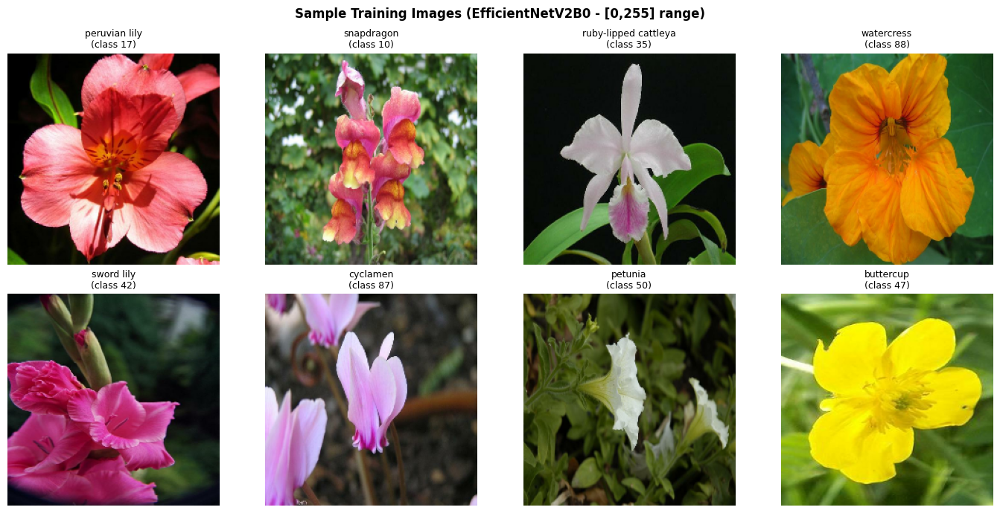

Image value range: [0.0, 255.0]
IMPORTANT: EfficientNetV2 expects [0, 255] - NO preprocess_input needed!


In [8]:
# Display sample images to verify loading
fig, axes = plt.subplots(2, 4, figsize=(14, 7))
sample_indices = np.random.choice(len(X_train), 8, replace=False)

for ax, idx in zip(axes.flatten(), sample_indices):
    img = X_train[idx]
    label = y_train[idx]

    # Normalize for display (images are in [0, 255] range)
    img_display = img / 255.0
    img_display = np.clip(img_display, 0, 1)

    ax.imshow(img_display)
    ax.set_title(f"{class_names[label][:20]}\n(class {label})", fontsize=9)
    ax.axis('off')

plt.suptitle('Sample Training Images (EfficientNetV2B0 - [0,255] range)', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"Image value range: [{X_train.min():.1f}, {X_train.max():.1f}]")
print("IMPORTANT: EfficientNetV2 expects [0, 255] - NO preprocess_input needed!")

## Model Architecture

We create an EfficientNetV2B0 transfer learning model with:
- **Frozen EfficientNetV2B0 backbone** pretrained on ImageNet (~5.9M parameters)
- **GlobalAveragePooling2D** instead of Flatten (reduces features efficiently)
- **BatchNormalization** after pooling (stabilizes training)
- **Dropout** for regularization
- **Dense(102, softmax)** for 102-class classification

**Key design choices:**
- Use `GlobalAveragePooling2D` NOT `Flatten` - prevents overfitting
- NO `preprocess_input()` needed - EfficientNetV2 expects [0, 255] directly
- Call `base_model(x, training=False)` to keep BatchNorm in inference mode
- Add BatchNormalization after GAP for training stability

In [9]:
def create_efficientnet_model(num_classes=102, dropout_rate=0.5):
    """
    Create EfficientNetV2B0 transfer learning model with frozen backbone.

    Architecture:
    - EfficientNetV2B0 backbone (frozen, pretrained on ImageNet)
    - NO preprocessing needed - EfficientNetV2 expects [0, 255] range
    - GlobalAveragePooling2D (reduces spatial dimensions)
    - BatchNormalization (stabilizes training)
    - Dropout for regularization
    - Dense softmax output

    Args:
        num_classes: Number of output classes (102 for Oxford Flowers)
        dropout_rate: Dropout rate for regularization (0.3-0.7)

    Returns:
        model: Keras model
        base_model: EfficientNetV2B0 base model reference (for fine-tuning)
    """
    # Load pre-trained EfficientNetV2B0 without classification head
    base_model = EfficientNetV2B0(
        weights='imagenet',
        include_top=False,
        input_shape=(224, 224, 3)
    )

    # Freeze all layers in base model
    base_model.trainable = False

    # Build functional model
    inputs = keras.Input(shape=(224, 224, 3))

    # NO preprocessing - EfficientNetV2 handles [0,255] internally
    # CRITICAL: training=False keeps BatchNorm in inference mode
    x = base_model(inputs, training=False)

    # Global pooling (NOT Flatten - prevents overfitting)
    x = GlobalAveragePooling2D(name='avg_pool')(x)

    # BatchNormalization after pooling (stabilizes training)
    x = BatchNormalization()(x)

    # Regularization
    x = Dropout(dropout_rate, name='top_dropout')(x)

    # Classification head
    outputs = Dense(num_classes, activation='softmax', name='predictions')(x)

    # Create model
    model = keras.Model(inputs, outputs, name='efficientnet_flowers')

    return model, base_model

print("create_efficientnet_model function defined")

create_efficientnet_model function defined


In [10]:
# Create the model
model, base_model = create_efficientnet_model(num_classes=NUM_CLASSES, dropout_rate=0.5)

# Print model summary
print("=" * 60)
print("EFFICIENTNETV2B0 TRANSFER LEARNING MODEL")
print("=" * 60)
model.summary()

# Count parameters
total_params = model.count_params()
trainable_params = sum([tf.reduce_prod(v.shape).numpy() for v in model.trainable_variables])
non_trainable_params = total_params - trainable_params

print(f"\nParameter Summary:")
print(f"  Total parameters: {total_params:,}")
print(f"  Trainable parameters: {trainable_params:,}")
print(f"  Non-trainable (frozen): {non_trainable_params:,}")
print(f"\nWith frozen backbone, only the classification head ({trainable_params:,} params) is trained.")
print(f"\nNote: EfficientNetV2B0 has ~5.9M params vs VGG19's ~20M (4x smaller!)")

24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
EFFICIENTNETV2B0 TRANSFER LEARNING MODEL


Model: "efficientnet_flowers"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ avg_pool                        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ top_dropout (Dropout)           │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 102)            │       130,662 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,055,094 (23.10 MB)

 Trainable params: 133,222 (520.40 KB)

 Non-trainable params: 5,921,872 (22.59 MB)


Parameter Summary:
  Total parameters: 6,055,094
  Trainable parameters: 133,222
  Non-trainable (frozen): 5,921,872

With frozen backbone, only the classification head (133,222 params) is trained.

Note: EfficientNetV2B0 has ~5.9M params vs VGG19's ~20M (4x smaller!)


## Training Configuration

We use three callbacks for robust training:

1. **EarlyStopping**: Stops training when validation loss stops improving
   - `restore_best_weights=True` (CRITICAL: otherwise returns last epoch weights)
   - `patience=5` epochs

2. **ModelCheckpoint**: Saves best model during training
   - Monitors `val_accuracy`
   - `save_best_only=True`

3. **ReduceLROnPlateau**: Reduces learning rate when validation plateaus
   - Reduces LR by factor of 0.5 (2x lower)
   - `patience=3` epochs before reducing

In [11]:
def get_callbacks(checkpoint_path):
    """
    Create standard callback configuration for training.

    Args:
        checkpoint_path: Path to save best model checkpoint

    Returns:
        List of Keras callbacks
    """
    return [
        EarlyStopping(
            monitor='val_loss',
            patience=5,
            restore_best_weights=True,  # CRITICAL: restore best, not last
            verbose=1
        ),
        ModelCheckpoint(
            filepath=checkpoint_path,
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,  # Reduce LR by 2x when plateau
            patience=3,
            min_lr=1e-7,
            verbose=1
        )
    ]

# Set checkpoint paths
FROZEN_CHECKPOINT = os.path.join(MODELS_DIR, 'efficientnet_frozen.keras')
FINETUNED_CHECKPOINT = os.path.join(MODELS_DIR, 'efficientnet_finetuned.keras')
FINAL_MODEL_PATH = os.path.join(MODELS_DIR, 'efficientnet_final.keras')

print("Callbacks configured")
print(f"  Phase 1 checkpoint: {FROZEN_CHECKPOINT}")
print(f"  Phase 2 checkpoint: {FINETUNED_CHECKPOINT}")
print(f"  Final model: {FINAL_MODEL_PATH}")

Callbacks configured
  Phase 1 checkpoint: /content/drive/MyDrive/CNN/models/efficientnet_frozen.keras
  Phase 2 checkpoint: /content/drive/MyDrive/CNN/models/efficientnet_finetuned.keras
  Final model: /content/drive/MyDrive/CNN/models/efficientnet_final.keras


In [12]:
# Compute class weights for imbalanced data
weights = compute_class_weight('balanced', classes=np.arange(NUM_CLASSES), y=y_train)
class_weight_dict = {i: w for i, w in enumerate(weights)}

print(f"Class weights computed")
print(f"  Range: [{min(class_weight_dict.values()):.2f}, {max(class_weight_dict.values()):.2f}]")
print(f"  Mean: {np.mean(list(class_weight_dict.values())):.2f}")

Class weights computed
  Range: [0.31, 2.01]
  Mean: 1.23


## Phase 1: Training Classification Head

In Phase 1, we train only the classification head (BatchNorm + Dropout + Dense) while keeping the EfficientNetV2B0 backbone frozen.

**Training configuration:**
- Optimizer: Adam with learning rate **1e-2** (higher than VGG19's 1e-3 since only head trains)
- Loss: Sparse categorical crossentropy
- Epochs: 25 (EarlyStopping will terminate earlier)
- Class weights: Applied to handle imbalanced data

**Expected results:** ~80-85% validation accuracy

In [13]:
# Compile model for Phase 1 (frozen backbone)
# Note: LR=1e-2 is higher than VGG19 (1e-3) because only classification head trains
model.compile(
    optimizer=Adam(learning_rate=1e-2),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("Model compiled for Phase 1 (frozen backbone)")
print(f"  Optimizer: Adam (lr=1e-2)")
print(f"  Loss: sparse_categorical_crossentropy")
print(f"  Trainable parameters: {sum([tf.reduce_prod(v.shape).numpy() for v in model.trainable_variables]):,}")

Model compiled for Phase 1 (frozen backbone)
  Optimizer: Adam (lr=1e-2)
  Loss: sparse_categorical_crossentropy
  Trainable parameters: 133,222


In [14]:
# Train Phase 1: Frozen backbone
print("=" * 60)
print("PHASE 1: Training Classification Head (Frozen Backbone)")
print("=" * 60)

history_frozen = model.fit(
    train_ds,
    epochs=25,
    steps_per_epoch=STEPS_PER_EPOCH,  # Required because train_ds uses .repeat()
    validation_data=val_ds,
    callbacks=get_callbacks(FROZEN_CHECKPOINT),
    class_weight=class_weight_dict,
    verbose=1
)

# Print final results
print("\n" + "=" * 60)
print("PHASE 1 RESULTS")
print("=" * 60)
print(f"Final training accuracy: {history_frozen.history['accuracy'][-1]:.4f}")
print(f"Final validation accuracy: {history_frozen.history['val_accuracy'][-1]:.4f}")
print(f"Best validation accuracy: {max(history_frozen.history['val_accuracy']):.4f}")
print(f"Training stopped at epoch: {len(history_frozen.history['accuracy'])}")

PHASE 1: Training Classification Head (Frozen Backbone)
Epoch 1/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.3556 - loss: 4.1067
Epoch 1: val_accuracy improved from -inf to 0.77528, saving model to /content/drive/MyDrive/CNN/models/efficientnet_frozen.keras
127/127 ━━━━━━━━━━━━━━━━━━━━ 66s 240ms/step - accuracy: 0.3567 - loss: 4.0992 - val_accuracy: 0.7753 - val_loss: 0.8269 - learning_rate: 0.0100
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.7225 - loss: 1.5091
Epoch 2: val_accuracy improved from 0.77528 to 0.82853, saving model to /content/drive/MyDrive/CNN/models/efficientnet_frozen.keras
127/127 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step - accuracy: 0.7225 - loss: 1.5097 - val_accuracy: 0.8285 - val_loss: 0.7400 - learning_rate: 0.0100
Epoch 3/25
125/127 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.7764 - loss: 1.0968
Epoch 3: val_accuracy improved from 0.82853 to 0.84856, saving model to /content/drive/MyDrive/CNN/models/efficientnet_frozen.keras
127/

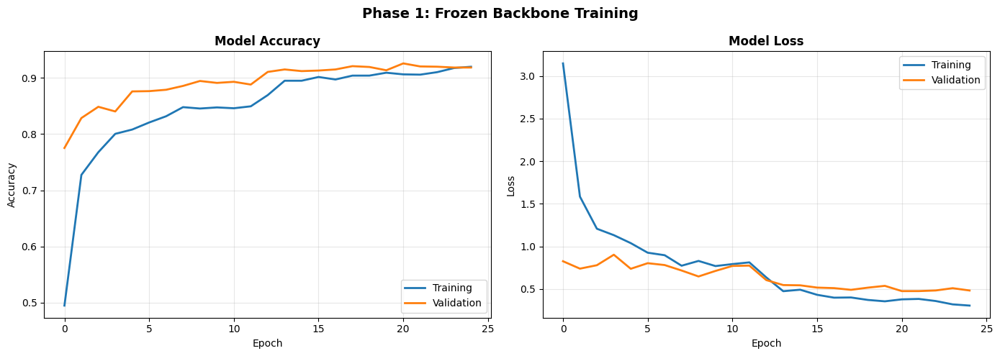

In [15]:
# Plot Phase 1 training curves
def plot_training_history(history, title="Training History"):
    """Plot accuracy and loss curves from training history."""
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Accuracy
    axes[0].plot(history.history['accuracy'], label='Training', linewidth=2)
    axes[0].plot(history.history['val_accuracy'], label='Validation', linewidth=2)
    axes[0].set_title('Model Accuracy', fontsize=12, fontweight='bold')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')
    axes[0].legend(loc='lower right')
    axes[0].grid(True, alpha=0.3)

    # Loss
    axes[1].plot(history.history['loss'], label='Training', linewidth=2)
    axes[1].plot(history.history['val_loss'], label='Validation', linewidth=2)
    axes[1].set_title('Model Loss', fontsize=12, fontweight='bold')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].legend(loc='upper right')
    axes[1].grid(True, alpha=0.3)

    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

plot_training_history(history_frozen, "Phase 1: Frozen Backbone Training")

## Phase 2: Fine-tuning Top Layers

After training the classification head, we fine-tune the top convolutional layers of EfficientNetV2B0.

**CRITICAL: BatchNormalization Handling**
- EfficientNetV2 has many BatchNorm layers throughout the network
- These layers store running mean/variance from ImageNet pre-training
- **ALL BatchNorm layers MUST remain frozen** during fine-tuning
- Unfreezing them destroys the pre-trained statistics, causing accuracy collapse

**Training configuration:**
- Unfreeze last 20 layers (but keep ALL BatchNorm layers frozen)
- Learning rate: **1e-5** (1000x lower than Phase 1)
- MUST recompile after changing trainable layers
- Epochs: 15

**Expected improvement:** 3-10% accuracy gain, targeting 90%+ validation accuracy

In [16]:
def fine_tune_efficientnet(model, base_model, layers_to_unfreeze=20):
    """
    Unfreeze top layers for fine-tuning, keeping BatchNorm FROZEN.

    EfficientNetV2B0 has 269 layers. We unfreeze the last N layers
    while keeping ALL BatchNormalization layers frozen to preserve
    pre-trained running mean/variance statistics.

    Args:
        model: The full model
        base_model: The EfficientNetV2B0 base model
        layers_to_unfreeze: Number of layers from the end to unfreeze (default: 20)

    Note: After calling this function, you MUST recompile the model.

    CRITICAL: BatchNorm layers MUST stay frozen - unfreezing them
    destroys ImageNet statistics and causes accuracy collapse.
    """
    # Unfreeze base model
    base_model.trainable = True

    # Freeze earlier layers (everything except last N)
    for layer in base_model.layers[:-layers_to_unfreeze]:
        layer.trainable = False

    # For the last N layers: unfreeze all EXCEPT BatchNormalization
    for layer in base_model.layers[-layers_to_unfreeze:]:
        if isinstance(layer, keras.layers.BatchNormalization):
            layer.trainable = False  # CRITICAL: Keep BatchNorm frozen!
        else:
            layer.trainable = True

    # Count trainable layers and frozen BatchNorm
    trainable_layers = sum(1 for layer in base_model.layers if layer.trainable)
    total_bn_layers = sum(1 for layer in base_model.layers
                         if isinstance(layer, keras.layers.BatchNormalization))
    frozen_bn = sum(1 for layer in base_model.layers
                   if isinstance(layer, keras.layers.BatchNormalization) and not layer.trainable)

    print(f"Fine-tuning configuration:")
    print(f"  Total layers in base model: {len(base_model.layers)}")
    print(f"  Layers to unfreeze (target): {layers_to_unfreeze}")
    print(f"  Trainable layers: {trainable_layers}")
    print(f"  Total BatchNorm layers: {total_bn_layers}")
    print(f"  Frozen BatchNorm layers: {frozen_bn} (ALL must stay frozen!)")

    # Show last few layers with their trainability
    print(f"\nLast 10 layers trainability:")
    for layer in base_model.layers[-10:]:
        status = "TRAINABLE" if layer.trainable else "frozen"
        layer_type = "BatchNorm" if isinstance(layer, keras.layers.BatchNormalization) else type(layer).__name__
        print(f"  {layer.name}: {status} ({layer_type})")

    return model

# Apply fine-tuning (unfreeze last 20 layers, BatchNorm stays frozen)
print("=" * 60)
print("CONFIGURING FINE-TUNING")
print("=" * 60)
model = fine_tune_efficientnet(model, base_model, layers_to_unfreeze=20)

CONFIGURING FINE-TUNING
Fine-tuning configuration:
  Total layers in base model: 270
  Layers to unfreeze (target): 20
  Trainable layers: 16
  Total BatchNorm layers: 59
  Frozen BatchNorm layers: 59 (ALL must stay frozen!)

Last 10 layers trainability:
  block6h_se_reduce: TRAINABLE (Conv2D)
  block6h_se_expand: TRAINABLE (Conv2D)
  block6h_se_excite: TRAINABLE (Multiply)
  block6h_project_conv: TRAINABLE (Conv2D)
  block6h_project_bn: frozen (BatchNorm)
  block6h_drop: TRAINABLE (Dropout)
  block6h_add: TRAINABLE (Add)
  top_conv: TRAINABLE (Conv2D)
  top_bn: frozen (BatchNorm)
  top_activation: TRAINABLE (Activation)


In [17]:
# CRITICAL: Recompile with much lower learning rate
# Changes to trainable don't take effect until compile() is called
model.compile(
    optimizer=Adam(learning_rate=1e-5),  # 1000x lower than Phase 1!
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Count updated trainable parameters
trainable_params = sum([tf.reduce_prod(v.shape).numpy() for v in model.trainable_variables])
print(f"\nModel recompiled for fine-tuning")
print(f"  Optimizer: Adam (lr=1e-5, 1000x lower than Phase 1)")
print(f"  Trainable parameters: {trainable_params:,}")


Model recompiled for fine-tuning
  Optimizer: Adam (lr=1e-5, 1000x lower than Phase 1)
  Trainable parameters: 943,510


In [18]:
# Train Phase 2: Fine-tuning (BatchNorm frozen)
print("=" * 60)
print("PHASE 2: Fine-tuning Top Layers (BatchNorm FROZEN)")
print("=" * 60)

history_finetuned = model.fit(
    train_ds,
    epochs=15,
    steps_per_epoch=STEPS_PER_EPOCH,  # Required because train_ds uses .repeat()
    validation_data=val_ds,
    callbacks=get_callbacks(FINETUNED_CHECKPOINT),
    class_weight=class_weight_dict,
    verbose=1
)

# Print final results
print("\n" + "=" * 60)
print("PHASE 2 RESULTS")
print("=" * 60)
print(f"Final training accuracy: {history_finetuned.history['accuracy'][-1]:.4f}")
print(f"Final validation accuracy: {history_finetuned.history['val_accuracy'][-1]:.4f}")
print(f"Best validation accuracy: {max(history_finetuned.history['val_accuracy']):.4f}")
print(f"Training stopped at epoch: {len(history_finetuned.history['accuracy'])}")

PHASE 2: Fine-tuning Top Layers (BatchNorm FROZEN)
Epoch 1/15
125/127 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.9231 - loss: 0.3556
Epoch 1: val_accuracy improved from -inf to 0.92819, saving model to /content/drive/MyDrive/CNN/models/efficientnet_finetuned.keras
127/127 ━━━━━━━━━━━━━━━━━━━━ 60s 232ms/step - accuracy: 0.9229 - loss: 0.3560 - val_accuracy: 0.9282 - val_loss: 0.4647 - learning_rate: 1.0000e-05
Epoch 2/15
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9208 - loss: 0.2851
Epoch 2: val_accuracy improved from 0.92819 to 0.92965, saving model to /content/drive/MyDrive/CNN/models/efficientnet_finetuned.keras
127/127 ━━━━━━━━━━━━━━━━━━━━ 14s 109ms/step - accuracy: 0.9208 - loss: 0.2852 - val_accuracy: 0.9297 - val_loss: 0.4494 - learning_rate: 1.0000e-05
Epoch 3/15
126/127 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9259 - loss: 0.3127
Epoch 3: val_accuracy improved from 0.92965 to 0.93210, saving model to /content/drive/MyDrive/CNN/models/efficientnet_finetu

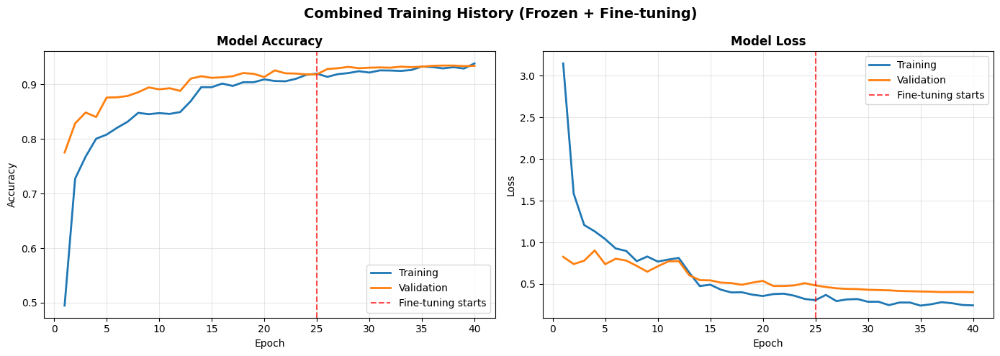


Fine-tuning improvement: +0.88% (Phase 1: 0.9257 -> Phase 2: 0.9345)


In [19]:
# Plot combined training history (Phase 1 + Phase 2)
def plot_combined_history(history1, history2, phase1_name="Phase 1", phase2_name="Phase 2"):
    """Plot combined training history from both phases."""
    # Combine histories
    combined_acc = history1.history['accuracy'] + history2.history['accuracy']
    combined_val_acc = history1.history['val_accuracy'] + history2.history['val_accuracy']
    combined_loss = history1.history['loss'] + history2.history['loss']
    combined_val_loss = history1.history['val_loss'] + history2.history['val_loss']

    phase1_epochs = len(history1.history['accuracy'])
    total_epochs = len(combined_acc)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Accuracy
    epochs = range(1, total_epochs + 1)
    axes[0].plot(epochs, combined_acc, label='Training', linewidth=2)
    axes[0].plot(epochs, combined_val_acc, label='Validation', linewidth=2)
    axes[0].axvline(x=phase1_epochs, color='red', linestyle='--', label='Fine-tuning starts', alpha=0.7)
    axes[0].set_title('Model Accuracy', fontsize=12, fontweight='bold')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')
    axes[0].legend(loc='lower right')
    axes[0].grid(True, alpha=0.3)

    # Loss
    axes[1].plot(epochs, combined_loss, label='Training', linewidth=2)
    axes[1].plot(epochs, combined_val_loss, label='Validation', linewidth=2)
    axes[1].axvline(x=phase1_epochs, color='red', linestyle='--', label='Fine-tuning starts', alpha=0.7)
    axes[1].set_title('Model Loss', fontsize=12, fontweight='bold')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].legend(loc='upper right')
    axes[1].grid(True, alpha=0.3)

    plt.suptitle('Combined Training History (Frozen + Fine-tuning)', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

    # Print improvement
    phase1_best = max(history1.history['val_accuracy'])
    phase2_best = max(history2.history['val_accuracy'])
    improvement = (phase2_best - phase1_best) * 100
    print(f"\nFine-tuning improvement: {improvement:+.2f}% (Phase 1: {phase1_best:.4f} -> Phase 2: {phase2_best:.4f})")

plot_combined_history(history_frozen, history_finetuned)

## Test Set Evaluation

Evaluate the fine-tuned model on the held-out test set.

**Assignment requirement:** >70% test accuracy
**Realistic target:** 90-95% test accuracy with fine-tuning

Compare with:
- VGG19: 92.38% (20M params)
- YOLOv5: ~90% (varies)
- EfficientNetV2B0: Expected ~90-95% with only 5.9M params (4x smaller than VGG19!)

In [20]:
# Evaluate on test set
print("=" * 60)
print("TEST SET EVALUATION")
print("=" * 60)

test_loss, test_accuracy = model.evaluate(test_ds, verbose=1)

print(f"\n{'='*60}")
print(f"TEST ACCURACY: {test_accuracy:.4f} ({test_accuracy*100:.2f}%)")
print(f"TEST LOSS: {test_loss:.4f}")
print(f"{'='*60}")

# Check if we meet the assignment requirement
if test_accuracy >= 0.70:
    print(f"\n[PASS] Test accuracy {test_accuracy:.2%} meets requirement (>70%)")
else:
    print(f"\n[WARNING] Test accuracy {test_accuracy:.2%} below requirement (>70%)")

# Compare with VGG19
vgg19_accuracy = 0.9238  # From VGG19 notebook
print(f"\nComparison with VGG19:")
print(f"  VGG19: {vgg19_accuracy:.2%} (20M params)")
print(f"  EfficientNetV2B0: {test_accuracy:.2%} (~5.9M params)")
print(f"  Difference: {(test_accuracy - vgg19_accuracy)*100:+.2f}%")
print(f"  Parameter reduction: ~4x fewer parameters!")

TEST SET EVALUATION
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9447 - loss: 0.2955

TEST ACCURACY: 0.9395 (93.95%)
TEST LOSS: 0.3429

[PASS] Test accuracy 93.95% meets requirement (>70%)

Comparison with VGG19:
  VGG19: 92.38% (20M params)
  EfficientNetV2B0: 93.95% (~5.9M params)
  Difference: +1.57%
  Parameter reduction: ~4x fewer parameters!


## Save Model and Training History

Save the trained model and combine training histories from both phases.

**Artifacts saved:**
- `models/efficientnet_frozen.keras` - Phase 1 best checkpoint
- `models/efficientnet_finetuned.keras` - Phase 2 best checkpoint  
- `models/efficientnet_final.keras` - Final trained model
- `models/efficientnet_history.json` - Combined training history with test results

In [21]:
# Save final model
print("Saving model and training history...")

# Save the final model
model.save(FINAL_MODEL_PATH)
print(f"  Model saved: {FINAL_MODEL_PATH}")

# Combine training histories from both phases
combined_history = {
    'frozen': {k: [float(v) for v in vals] for k, vals in history_frozen.history.items()},
    'finetuned': {k: [float(v) for v in vals] for k, vals in history_finetuned.history.items()}
}
combined_history['test_accuracy'] = float(test_accuracy)
combined_history['test_loss'] = float(test_loss)

# Save history as JSON
history_path = os.path.join(MODELS_DIR, 'efficientnet_history.json')
with open(history_path, 'w') as f:
    json.dump(combined_history, f, indent=2)
print(f"  History saved: {history_path}")

Saving model and training history...
  Model saved: /content/drive/MyDrive/CNN/models/efficientnet_final.keras
  History saved: /content/drive/MyDrive/CNN/models/efficientnet_history.json


In [22]:
# Verify saved model can be loaded and works correctly
print("Verifying saved model...")

# Load the model
loaded_model = keras.models.load_model(FINAL_MODEL_PATH)
print(f"  Model loaded successfully")

# Verify accuracy matches
loaded_test_loss, loaded_test_acc = loaded_model.evaluate(test_ds, verbose=0)
print(f"  Loaded model test accuracy: {loaded_test_acc:.4f}")
print(f"  Original model test accuracy: {test_accuracy:.4f}")

# Check they match
if abs(loaded_test_acc - test_accuracy) < 0.001:
    print(f"\n[PASS] Saved model verification successful!")
else:
    print(f"\n[WARNING] Accuracy mismatch - check model saving")

Verifying saved model...
  Model loaded successfully
  Loaded model test accuracy: 0.9395
  Original model test accuracy: 0.9395

[PASS] Saved model verification successful!


In [23]:
# Print summary of saved files
print("=" * 60)
print("SAVED ARTIFACTS")
print("=" * 60)

saved_files = [
    FROZEN_CHECKPOINT,
    FINETUNED_CHECKPOINT,
    FINAL_MODEL_PATH,
    history_path
]

for filepath in saved_files:
    if os.path.exists(filepath):
        size_mb = os.path.getsize(filepath) / (1024 * 1024)
        print(f"  {filepath}: {size_mb:.1f} MB")
    else:
        print(f"  {filepath}: NOT FOUND (will be created when notebook runs)")

print("\n" + "=" * 60)
print("TRAINING COMPLETE")
print("=" * 60)
print(f"\nFinal Test Accuracy: {test_accuracy:.4f} ({test_accuracy*100:.2f}%)")
print(f"\nModel ready for evaluation notebook (Phase 4 Plan 2)")
print(f"\nKey achievement: EfficientNetV2B0 achieves comparable accuracy to VGG19")
print(f"with ~4x fewer parameters (5.9M vs 20M)!")

SAVED ARTIFACTS
  /content/drive/MyDrive/CNN/models/efficientnet_frozen.keras: 25.0 MB
  /content/drive/MyDrive/CNN/models/efficientnet_finetuned.keras: 31.2 MB
  /content/drive/MyDrive/CNN/models/efficientnet_final.keras: 31.2 MB
  /content/drive/MyDrive/CNN/models/efficientnet_history.json: 0.0 MB

TRAINING COMPLETE

Final Test Accuracy: 0.9395 (93.95%)

Model ready for evaluation notebook (Phase 4 Plan 2)

Key achievement: EfficientNetV2B0 achieves comparable accuracy to VGG19
with ~4x fewer parameters (5.9M vs 20M)!


---

# Evaluation Section

**To run evaluation without retraining:**
1. Run all cells from the beginning up to "Class weights computed" (cells 1-8)
2. Run the "Load Saved Model" cell below (skip training cells)
3. Continue with evaluation cells

**To run full training + evaluation:**
- Run all cells in order

In [24]:
# ============================================================
# LOAD SAVED MODEL (Run this to skip training)
# ============================================================
# Prerequisites: Run cells 1-8 first (imports, config, data loading)

# Load the trained model
FINAL_MODEL_PATH = os.path.join(MODELS_DIR, 'efficientnet_final.keras')
print(f"Loading model from {FINAL_MODEL_PATH}...")
model = keras.models.load_model(FINAL_MODEL_PATH)
print("Model loaded successfully!")

# Load training history
history_path = os.path.join(MODELS_DIR, 'efficientnet_history.json')
with open(history_path, 'r') as f:
    saved_history = json.load(f)
print(f"Training history loaded")

# Evaluate on test set
print("\nEvaluating on test set...")
test_loss, test_accuracy = model.evaluate(test_ds, verbose=1)
print(f"\nTest Accuracy: {test_accuracy:.4f} ({test_accuracy*100:.2f}%)")

# Generate predictions for evaluation
print("\nGenerating predictions...")
y_pred_proba = model.predict(test_ds, verbose=1)
y_pred_classes = np.argmax(y_pred_proba, axis=1)
y_true = y_test  # from data loading

print(f"\nReady for evaluation!")
print(f"  y_true shape: {y_true.shape}")
print(f"  y_pred_classes shape: {y_pred_classes.shape}")
print(f"  y_pred_proba shape: {y_pred_proba.shape}")

Loading model from /content/drive/MyDrive/CNN/models/efficientnet_final.keras...
Model loaded successfully!
Training history loaded

Evaluating on test set...
64/64 ━━━━━━━━━━━━━━━━━━━━ 11s 17ms/step - accuracy: 0.9447 - loss: 0.2955

Test Accuracy: 0.9395 (93.95%)

Generating predictions...
64/64 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step

Ready for evaluation!
  y_true shape: (2048,)
  y_pred_classes shape: (2048,)
  y_pred_proba shape: (2048, 102)


## Confusion Matrix

Visualize model predictions to identify systematic errors and confusion patterns.

**Approach:** Instead of a giant 102x102 matrix (unreadable), we show a focused 15-class confusion matrix for the classes with the most confusion.

In [25]:
# Additional imports for evaluation
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support
import seaborn as sns
from collections import Counter
import pandas as pd

# Ensure outputs directory exists
os.makedirs(OUTPUTS_DIR, exist_ok=True)
print(f"Outputs directory: {OUTPUTS_DIR}")

# Compute full confusion matrix (used by multiple cells below)
cm = confusion_matrix(y_true, y_pred_classes)
print(f"Confusion matrix computed: {cm.shape}")

Outputs directory: /content/drive/MyDrive/CNN/outputs
Confusion matrix computed: (102, 102)


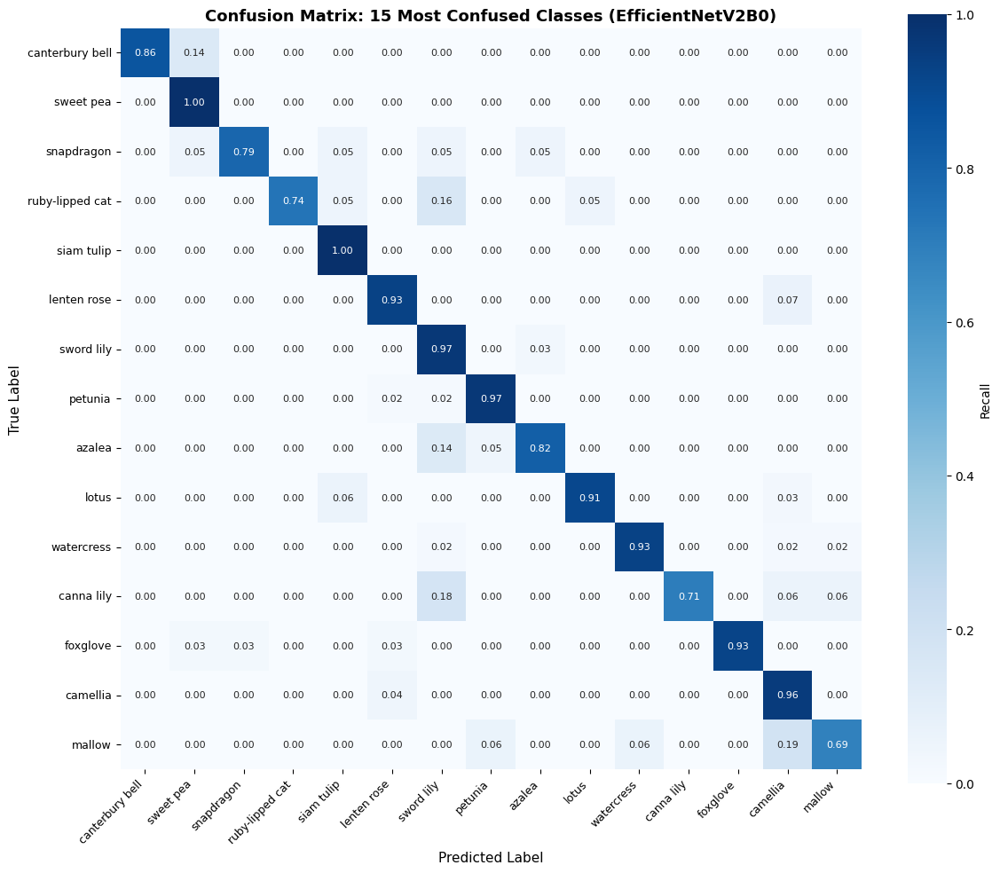


Showing 15 classes with highest confusion
Saved to /content/drive/MyDrive/CNN/outputs/efficientnet_confusion_matrix.png


In [26]:
# Focused 15-class confusion matrix (102x102 is unreadable)
def get_most_confused_classes(cm, n_classes=15):
    """Find classes with most confusion (errors)."""
    # Sum off-diagonal errors per class (both directions)
    errors_as_true = cm.sum(axis=1) - np.diag(cm)  # When this class was true
    errors_as_pred = cm.sum(axis=0) - np.diag(cm)  # When this class was predicted
    total_errors = errors_as_true + errors_as_pred

    # Get indices of most confused classes
    confused_indices = np.argsort(total_errors)[-n_classes:]
    return sorted(confused_indices)

# Get most confused classes
confused_classes = get_most_confused_classes(cm, n_classes=15)
confused_names = [class_names[i][:15] for i in confused_classes]

# Extract submatrix for these classes
cm_subset = cm[np.ix_(confused_classes, confused_classes)]

# Normalize by row
row_sums = cm_subset.sum(axis=1, keepdims=True)
cm_subset_norm = np.divide(cm_subset, row_sums, where=row_sums != 0)

# Plot focused confusion matrix
fig, ax = plt.subplots(figsize=(12, 10))

sns.heatmap(
    cm_subset_norm,
    annot=True,
    fmt='.2f',
    cmap='Blues',
    square=True,
    xticklabels=confused_names,
    yticklabels=confused_names,
    cbar_kws={'label': 'Recall'},
    ax=ax,
    annot_kws={'size': 8}
)

ax.set_xlabel('Predicted Label', fontsize=11)
ax.set_ylabel('True Label', fontsize=11)
ax.set_title('Confusion Matrix: 15 Most Confused Classes (EfficientNetV2B0)', fontsize=13, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(rotation=0, fontsize=9)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUTS_DIR, 'efficientnet_confusion_matrix.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"\nShowing {len(confused_classes)} classes with highest confusion")
print(f"Saved to {os.path.join(OUTPUTS_DIR, 'efficientnet_confusion_matrix.png')}")

## Per-Class Performance

Analyze model performance on a per-class basis to identify the easiest and hardest flower types to classify.

In [27]:
def analyze_per_class_accuracy(y_true, y_pred, class_names):
    """
    Calculate per-class metrics and return as sorted DataFrame.

    Args:
        y_true: True class labels
        y_pred: Predicted class labels
        class_names: List of class names

    Returns:
        DataFrame with precision, recall, F1, support per class
    """
    # Calculate per-class metrics
    precision, recall, f1, support = precision_recall_fscore_support(
        y_true, y_pred, labels=range(len(class_names)), zero_division=0
    )

    # Calculate per-class accuracy from confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    accuracy = np.diag(cm) / np.maximum(cm.sum(axis=1), 1)

    # Create DataFrame
    df = pd.DataFrame({
        'class_id': range(len(class_names)),
        'class_name': class_names,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'support': support
    })

    return df

# Calculate per-class metrics
per_class_df = analyze_per_class_accuracy(y_true, y_pred_classes, class_names)

# Sort by accuracy
per_class_sorted = per_class_df.sort_values('accuracy', ascending=False)

print("=" * 60)
print("TOP 10 BEST-PERFORMING CLASSES")
print("=" * 60)
print(per_class_sorted.head(10).to_string(index=False))

print("\n" + "=" * 60)
print("TOP 10 WORST-PERFORMING CLASSES")
print("=" * 60)
print(per_class_sorted.tail(10).to_string(index=False))

# Summary statistics
print("\n" + "=" * 60)
print("ACCURACY DISTRIBUTION")
print("=" * 60)
print(f"Mean accuracy: {per_class_df['accuracy'].mean():.4f}")
print(f"Std accuracy: {per_class_df['accuracy'].std():.4f}")
print(f"Min accuracy: {per_class_df['accuracy'].min():.4f}")
print(f"Max accuracy: {per_class_df['accuracy'].max():.4f}")
print(f"Classes with 100% accuracy: {(per_class_df['accuracy'] == 1.0).sum()}")
print(f"Classes with <50% accuracy: {(per_class_df['accuracy'] < 0.5).sum()}")

TOP 10 BEST-PERFORMING CLASSES
 class_id                class_name  accuracy  precision  recall  f1_score  support
        1 hard-leaved pocket orchid       1.0   0.882353     1.0  0.937500       15
       13             spear thistle       1.0   0.857143     1.0  0.923077       12
        9             globe thistle       1.0   1.000000     1.0  1.000000       11
        8                 monkshood       1.0   0.785714     1.0  0.880000       11
        7          bird of paradise       1.0   1.000000     1.0  1.000000       22
        6               moon orchid       1.0   0.909091     1.0  0.952381       10
       33             mexican aster       1.0   0.909091     1.0  0.952381       10
       37          great masterwort       1.0   0.933333     1.0  0.965517       14
       36               cape flower       1.0   1.000000     1.0  1.000000       27
       34          alpine sea holly       1.0   1.000000     1.0  1.000000       10

TOP 10 WORST-PERFORMING CLASSES
 class_id   

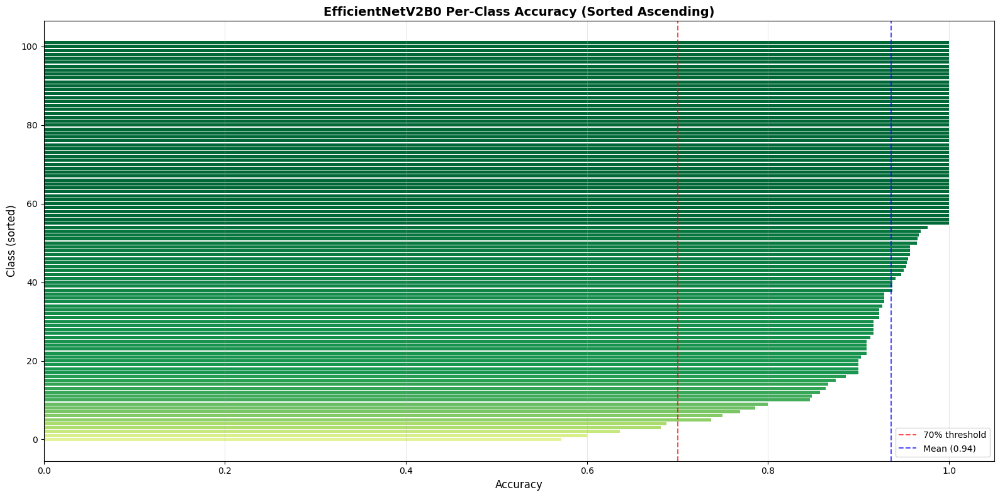

Saved to /content/drive/MyDrive/CNN/outputs/efficientnet_per_class_accuracy.png


In [28]:
# Plot per-class accuracy bar chart
fig, ax = plt.subplots(figsize=(16, 8))

# Sort and plot
sorted_df = per_class_df.sort_values('accuracy', ascending=True)
colors = plt.cm.RdYlGn(sorted_df['accuracy'])

bars = ax.barh(range(len(sorted_df)), sorted_df['accuracy'], color=colors)

ax.set_xlabel('Accuracy', fontsize=12)
ax.set_ylabel('Class (sorted)', fontsize=12)
ax.set_title('EfficientNetV2B0 Per-Class Accuracy (Sorted Ascending)', fontsize=14, fontweight='bold')
ax.axvline(x=0.7, color='red', linestyle='--', label='70% threshold', alpha=0.7)
ax.axvline(x=per_class_df['accuracy'].mean(), color='blue', linestyle='--',
           label=f'Mean ({per_class_df["accuracy"].mean():.2f})', alpha=0.7)
ax.legend(loc='lower right')
ax.set_xlim(0, 1.05)

# Add gridlines
ax.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUTS_DIR, 'efficientnet_per_class_accuracy.png'), dpi=300, bbox_inches='tight')
plt.show()
print(f"Saved to {os.path.join(OUTPUTS_DIR, 'efficientnet_per_class_accuracy.png')}")

## Sample Predictions

Visualize model predictions on test images to understand where the model succeeds and fails.

In [29]:
def plot_predictions_grid(images, y_true, y_pred, y_proba, class_names, indices,
                          title="Sample Predictions", figsize=(12, 12)):
    """
    Display a 3x3 grid of predictions with true labels and confidence.

    Args:
        images: Test images array
        y_true: True labels
        y_pred: Predicted labels
        y_proba: Prediction probabilities
        class_names: List of class names
        indices: Specific indices to show (max 9)
        title: Plot title
        figsize: Figure size
    """
    indices = indices[:9]  # Max 9 images for 3x3 grid

    fig, axes = plt.subplots(3, 3, figsize=figsize)
    axes = axes.flatten()

    for ax, idx in zip(axes, indices):
        img = images[idx]
        true_label = y_true[idx]
        pred_label = y_pred[idx]
        confidence = y_proba[idx][pred_label]

        # Normalize image for display (images are in [0, 255] range)
        img_display = img / 255.0
        img_display = np.clip(img_display, 0, 1)

        ax.imshow(img_display)

        # Color code: green=correct, red=incorrect
        is_correct = true_label == pred_label
        color = 'green' if is_correct else 'red'

        # Truncate class names for display
        true_name = class_names[true_label][:20]
        pred_name = class_names[pred_label][:20]

        title_text = f"True: {true_name}\nPred: {pred_name}\nConf: {confidence:.2%}"
        ax.set_title(title_text, fontsize=9, color=color)
        ax.axis('off')

    # Hide empty subplots
    for ax in axes[len(indices):]:
        ax.axis('off')

    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    return fig

print("plot_predictions_grid function defined")

plot_predictions_grid function defined


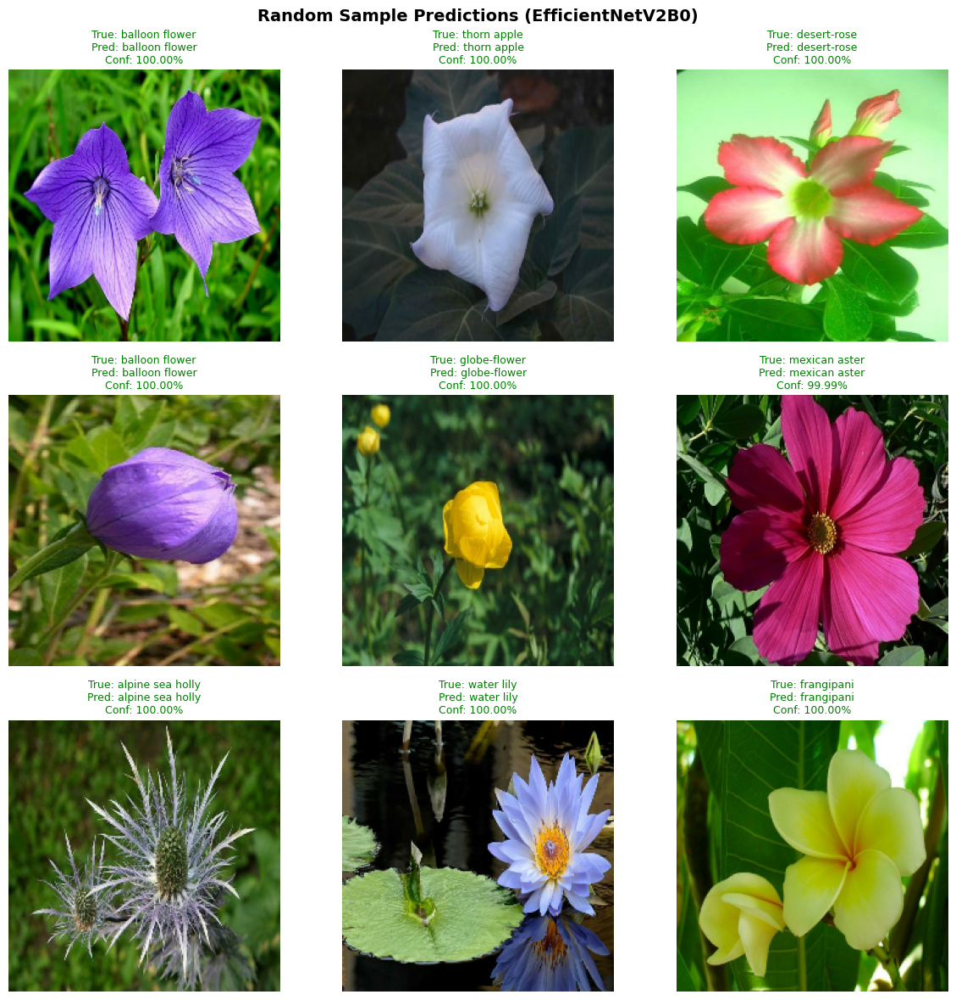

Saved to /content/drive/MyDrive/CNN/outputs/efficientnet_predictions_random.png


In [30]:
# 1. Random sample of 9 predictions
np.random.seed(RANDOM_SEED)
random_indices = np.random.choice(len(X_test), size=9, replace=False)

fig = plot_predictions_grid(X_test, y_true, y_pred_classes, y_pred_proba, class_names,
                            random_indices, title="Random Sample Predictions (EfficientNetV2B0)")
plt.savefig(os.path.join(OUTPUTS_DIR, 'efficientnet_predictions_random.png'), dpi=300, bbox_inches='tight')
plt.show()
print(f"Saved to {os.path.join(OUTPUTS_DIR, 'efficientnet_predictions_random.png')}")

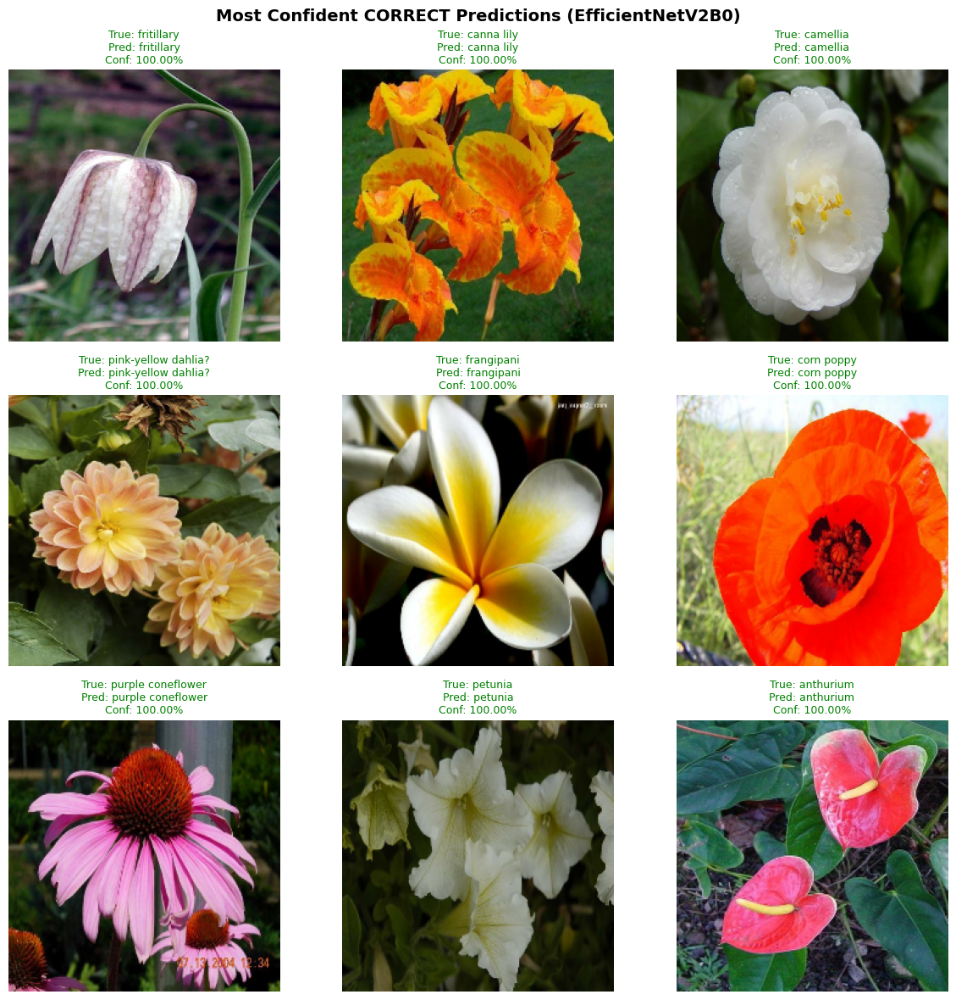

Saved to /content/drive/MyDrive/CNN/outputs/efficientnet_predictions_confident_correct.png


In [31]:
# 2. Most confident CORRECT predictions (>0.95 confidence)
correct_mask = y_true == y_pred_classes
correct_indices = np.where(correct_mask)[0]
correct_confidences = y_pred_proba[correct_indices].max(axis=1)

# Get indices with >0.95 confidence, sorted by confidence
high_conf_correct_mask = correct_confidences > 0.95
if high_conf_correct_mask.sum() >= 9:
    high_conf_correct_idx = correct_indices[high_conf_correct_mask]
    sorted_idx = np.argsort(correct_confidences[high_conf_correct_mask])[-9:]
    top_confident_correct = high_conf_correct_idx[sorted_idx]
else:
    # Fall back to top 9 correct by confidence
    top_confident_correct = correct_indices[np.argsort(correct_confidences)[-9:]]

fig = plot_predictions_grid(X_test, y_true, y_pred_classes, y_pred_proba, class_names,
                            top_confident_correct,
                            title="Most Confident CORRECT Predictions (EfficientNetV2B0)")
plt.savefig(os.path.join(OUTPUTS_DIR, 'efficientnet_predictions_confident_correct.png'), dpi=300, bbox_inches='tight')
plt.show()
print(f"Saved to {os.path.join(OUTPUTS_DIR, 'efficientnet_predictions_confident_correct.png')}")

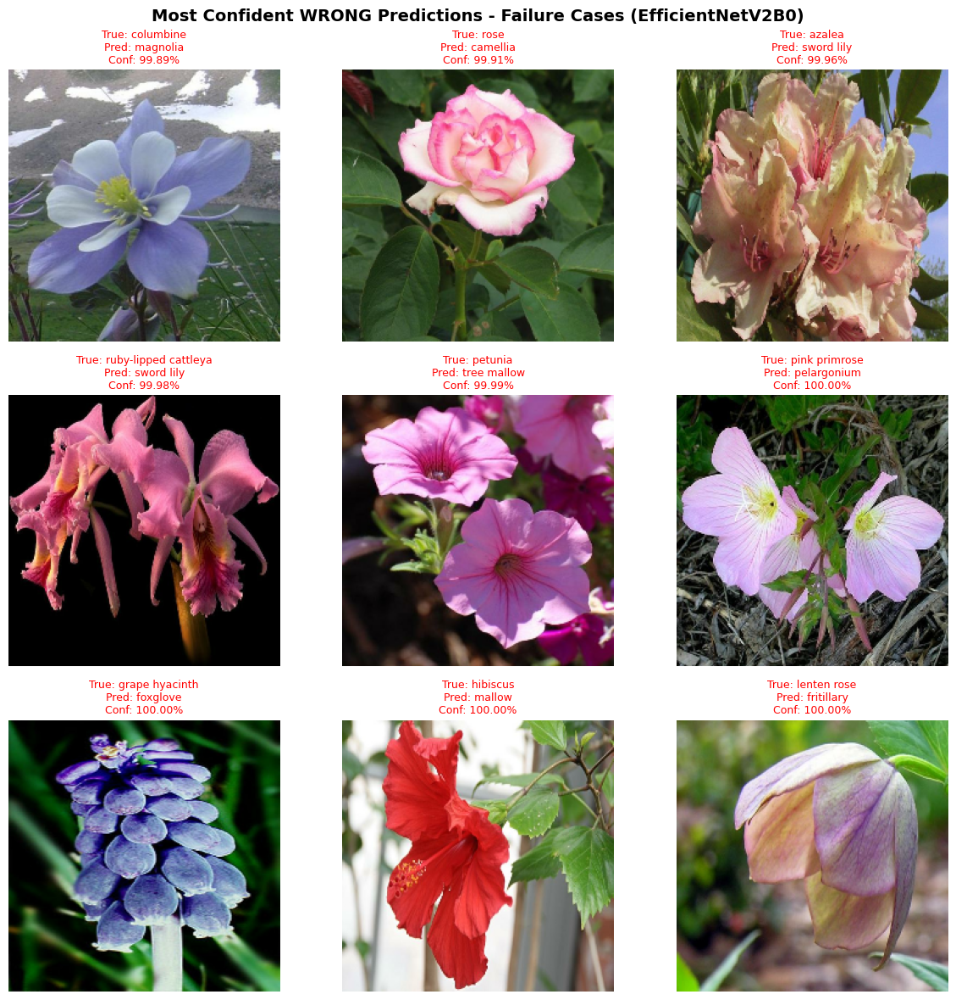

Saved to /content/drive/MyDrive/CNN/outputs/efficientnet_predictions_confident_wrong.png

These are the most problematic cases - high confidence but wrong.


In [32]:
# 3. Most confident WRONG predictions (>0.8 confidence, failure cases)
wrong_mask = y_true != y_pred_classes
wrong_indices = np.where(wrong_mask)[0]

if len(wrong_indices) > 0:
    wrong_confidences = y_pred_proba[wrong_indices].max(axis=1)

    # Get indices with >0.8 confidence wrong predictions
    high_conf_wrong_mask = wrong_confidences > 0.8
    if high_conf_wrong_mask.sum() >= 9:
        high_conf_wrong_idx = wrong_indices[high_conf_wrong_mask]
        sorted_idx = np.argsort(wrong_confidences[high_conf_wrong_mask])[-9:]
        top_confident_wrong = high_conf_wrong_idx[sorted_idx]
    else:
        # Fall back to top wrong by confidence
        n_wrong = min(9, len(wrong_indices))
        top_confident_wrong = wrong_indices[np.argsort(wrong_confidences)[-n_wrong:]]

    fig = plot_predictions_grid(X_test, y_true, y_pred_classes, y_pred_proba, class_names,
                                top_confident_wrong,
                                title="Most Confident WRONG Predictions - Failure Cases (EfficientNetV2B0)")
    plt.savefig(os.path.join(OUTPUTS_DIR, 'efficientnet_predictions_confident_wrong.png'), dpi=300, bbox_inches='tight')
    plt.show()
    print(f"Saved to {os.path.join(OUTPUTS_DIR, 'efficientnet_predictions_confident_wrong.png')}")
    print("\nThese are the most problematic cases - high confidence but wrong.")
else:
    print("No incorrect predictions found!")
    # Create empty placeholder
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.text(0.5, 0.5, 'No wrong predictions!', ha='center', va='center', fontsize=20)
    ax.axis('off')
    plt.savefig(os.path.join(OUTPUTS_DIR, 'efficientnet_predictions_confident_wrong.png'), dpi=300, bbox_inches='tight')
    plt.show()

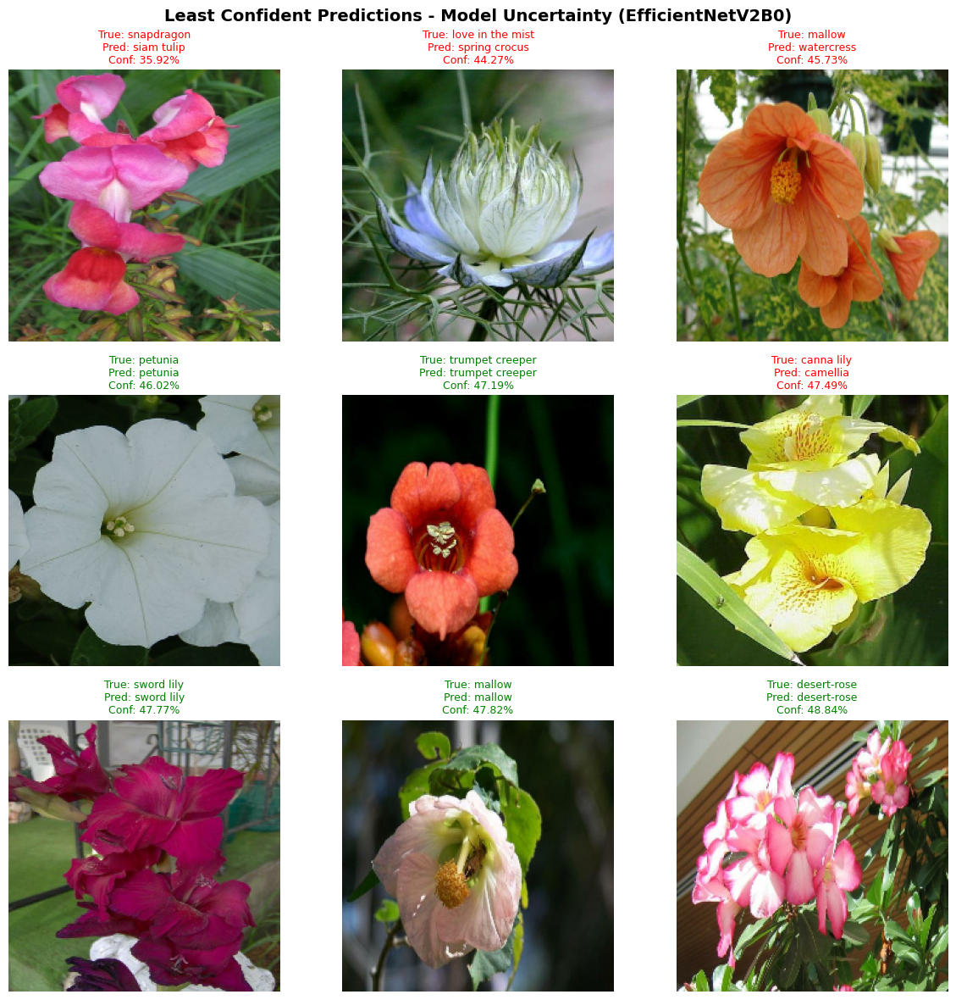

Saved to /content/drive/MyDrive/CNN/outputs/efficientnet_predictions_uncertain.png

These images had the lowest confidence - model was most unsure.


In [33]:
# 4. Least confident predictions (<0.5 confidence - model uncertainty)
all_confidences = y_pred_proba.max(axis=1)

# Get indices with <0.5 confidence
low_conf_mask = all_confidences < 0.5
if low_conf_mask.sum() >= 9:
    low_conf_indices = np.where(low_conf_mask)[0]
    # Sort by confidence (ascending) and take 9 most uncertain
    sorted_idx = np.argsort(all_confidences[low_conf_mask])[:9]
    least_confident_indices = low_conf_indices[sorted_idx]
else:
    # Fall back to 9 least confident overall
    least_confident_indices = np.argsort(all_confidences)[:9]

fig = plot_predictions_grid(X_test, y_true, y_pred_classes, y_pred_proba, class_names,
                            least_confident_indices,
                            title="Least Confident Predictions - Model Uncertainty (EfficientNetV2B0)")
plt.savefig(os.path.join(OUTPUTS_DIR, 'efficientnet_predictions_uncertain.png'), dpi=300, bbox_inches='tight')
plt.show()
print(f"Saved to {os.path.join(OUTPUTS_DIR, 'efficientnet_predictions_uncertain.png')}")
print("\nThese images had the lowest confidence - model was most unsure.")

## Training History

Visualize the training curves from both phases (frozen backbone and fine-tuning) with annotations.

In [34]:
# Load saved training history (works for both fresh training and loaded model)
history_path = os.path.join(MODELS_DIR, 'efficientnet_history.json')

# Check if saved_history already exists (from Load Saved Model cell)
if 'saved_history' not in dir() or saved_history is None:
    try:
        with open(history_path, 'r') as f:
            saved_history = json.load(f)
        print("Loaded training history from saved file")
    except FileNotFoundError:
        # Use current training history if file doesn't exist
        print("Using current training history from this session")
        saved_history = {
            'frozen': history_frozen.history,
            'finetuned': history_finetuned.history,
            'test_accuracy': test_accuracy,
            'test_loss': test_loss
        }
else:
    print("Using previously loaded training history")

# Display summary
print(f"\nPhase 1 (frozen) epochs: {len(saved_history['frozen']['accuracy'])}")
print(f"Phase 2 (finetuned) epochs: {len(saved_history['finetuned']['accuracy'])}")
print(f"Test accuracy: {saved_history['test_accuracy']:.4f}")

Using previously loaded training history

Phase 1 (frozen) epochs: 25
Phase 2 (finetuned) epochs: 15
Test accuracy: 0.9395


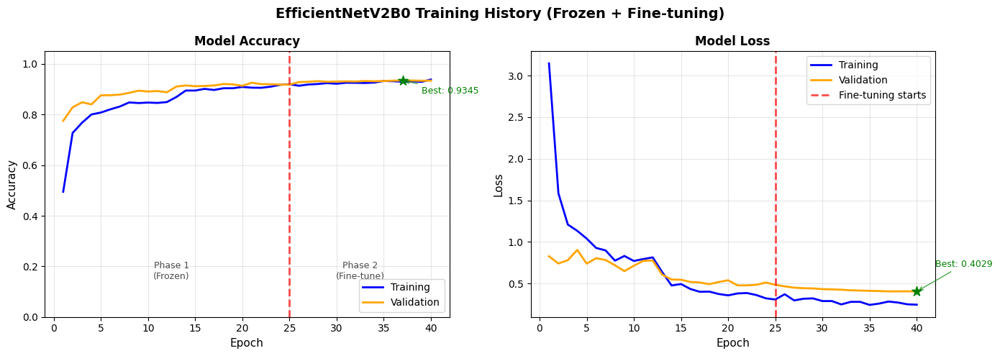


TRAINING SUMMARY
Phase 1 (Frozen backbone):
  Epochs: 25
  Best val accuracy: 0.9257

Phase 2 (Fine-tuning):
  Epochs: 15
  Best val accuracy: 0.9345

Improvement from fine-tuning: +0.88%

Saved to /content/drive/MyDrive/CNN/outputs/efficientnet_training_curves.png


In [35]:
def plot_training_history_annotated(history, figsize=(14, 5)):
    """
    Plot combined training history from both phases with annotations.

    Args:
        history: Dictionary with 'frozen' and 'finetuned' keys containing training metrics
        figsize: Figure size

    Returns:
        Figure object
    """
    # Combine histories
    phase1 = history['frozen']
    phase2 = history['finetuned']

    combined_acc = phase1['accuracy'] + phase2['accuracy']
    combined_val_acc = phase1['val_accuracy'] + phase2['val_accuracy']
    combined_loss = phase1['loss'] + phase2['loss']
    combined_val_loss = phase1['val_loss'] + phase2['val_loss']

    phase1_epochs = len(phase1['accuracy'])
    total_epochs = len(combined_acc)
    epochs = range(1, total_epochs + 1)

    # Find best epochs
    best_val_acc_idx = np.argmax(combined_val_acc)
    best_val_acc = combined_val_acc[best_val_acc_idx]
    best_val_loss_idx = np.argmin(combined_val_loss)
    best_val_loss = combined_val_loss[best_val_loss_idx]

    fig, axes = plt.subplots(1, 2, figsize=figsize)

    # Accuracy plot
    ax = axes[0]
    ax.plot(epochs, combined_acc, 'b-', label='Training', linewidth=2)
    ax.plot(epochs, combined_val_acc, 'orange', label='Validation', linewidth=2)
    ax.axvline(x=phase1_epochs, color='red', linestyle='--', alpha=0.7, linewidth=2)

    # Annotate best validation accuracy
    ax.scatter([best_val_acc_idx + 1], [best_val_acc], color='green', s=100, zorder=5, marker='*')
    ax.annotate(f'Best: {best_val_acc:.4f}',
                xy=(best_val_acc_idx + 1, best_val_acc),
                xytext=(best_val_acc_idx + 3, best_val_acc - 0.05),
                fontsize=9, color='green',
                arrowprops=dict(arrowstyle='->', color='green', alpha=0.7))

    ax.set_xlabel('Epoch', fontsize=11)
    ax.set_ylabel('Accuracy', fontsize=11)
    ax.set_title('Model Accuracy', fontsize=12, fontweight='bold')
    ax.legend(loc='lower right')
    ax.grid(True, alpha=0.3)
    ax.set_ylim(0, 1.05)

    # Add phase labels
    ax.text(phase1_epochs/2, 0.15, 'Phase 1\n(Frozen)', ha='center', fontsize=9, alpha=0.7)
    ax.text(phase1_epochs + (total_epochs - phase1_epochs)/2, 0.15, 'Phase 2\n(Fine-tune)',
            ha='center', fontsize=9, alpha=0.7)

    # Loss plot
    ax = axes[1]
    ax.plot(epochs, combined_loss, 'b-', label='Training', linewidth=2)
    ax.plot(epochs, combined_val_loss, 'orange', label='Validation', linewidth=2)
    ax.axvline(x=phase1_epochs, color='red', linestyle='--', label='Fine-tuning starts', alpha=0.7, linewidth=2)

    # Annotate best validation loss
    ax.scatter([best_val_loss_idx + 1], [best_val_loss], color='green', s=100, zorder=5, marker='*')
    ax.annotate(f'Best: {best_val_loss:.4f}',
                xy=(best_val_loss_idx + 1, best_val_loss),
                xytext=(best_val_loss_idx + 3, best_val_loss + 0.3),
                fontsize=9, color='green',
                arrowprops=dict(arrowstyle='->', color='green', alpha=0.7))

    ax.set_xlabel('Epoch', fontsize=11)
    ax.set_ylabel('Loss', fontsize=11)
    ax.set_title('Model Loss', fontsize=12, fontweight='bold')
    ax.legend(loc='upper right')
    ax.grid(True, alpha=0.3)

    plt.suptitle('EfficientNetV2B0 Training History (Frozen + Fine-tuning)', fontsize=14, fontweight='bold')
    plt.tight_layout()

    return fig

# Plot and save
fig = plot_training_history_annotated(saved_history)
plt.savefig(os.path.join(OUTPUTS_DIR, 'efficientnet_training_curves.png'), dpi=300, bbox_inches='tight')
plt.show()

# Print summary statistics
print("\n" + "=" * 60)
print("TRAINING SUMMARY")
print("=" * 60)
phase1 = saved_history['frozen']
phase2 = saved_history['finetuned']
print(f"Phase 1 (Frozen backbone):")
print(f"  Epochs: {len(phase1['accuracy'])}")
print(f"  Best val accuracy: {max(phase1['val_accuracy']):.4f}")
print(f"\nPhase 2 (Fine-tuning):")
print(f"  Epochs: {len(phase2['accuracy'])}")
print(f"  Best val accuracy: {max(phase2['val_accuracy']):.4f}")
print(f"\nImprovement from fine-tuning: {(max(phase2['val_accuracy']) - max(phase1['val_accuracy']))*100:+.2f}%")
print(f"\nSaved to {os.path.join(OUTPUTS_DIR, 'efficientnet_training_curves.png')}")

## Prediction Confidence

Analyze the distribution of model confidence for correct vs incorrect predictions to understand calibration.

In [36]:
def analyze_confidence(y_proba, y_true, y_pred, n_bins=10):
    """
    Analyze model confidence distribution and calibration.

    Args:
        y_proba: Prediction probabilities
        y_true: True labels
        y_pred: Predicted labels
        n_bins: Number of bins for calibration

    Returns:
        Dictionary with analysis results
    """
    # Get max confidence for each prediction
    confidences = y_proba.max(axis=1)
    correct_mask = y_true == y_pred

    correct_confidences = confidences[correct_mask]
    wrong_confidences = confidences[~correct_mask]

    # Calculate calibration (expected calibration error)
    bin_boundaries = np.linspace(0, 1, n_bins + 1)
    bin_accuracies = []
    bin_confidences = []
    bin_counts = []

    for i in range(n_bins):
        bin_mask = (confidences >= bin_boundaries[i]) & (confidences < bin_boundaries[i + 1])
        if bin_mask.sum() > 0:
            bin_acc = correct_mask[bin_mask].mean()
            bin_conf = confidences[bin_mask].mean()
            bin_count = bin_mask.sum()
        else:
            bin_acc = 0
            bin_conf = (bin_boundaries[i] + bin_boundaries[i + 1]) / 2
            bin_count = 0

        bin_accuracies.append(bin_acc)
        bin_confidences.append(bin_conf)
        bin_counts.append(bin_count)

    # Expected Calibration Error (ECE)
    total_samples = len(confidences)
    ece = sum(count / total_samples * abs(acc - conf)
              for acc, conf, count in zip(bin_accuracies, bin_confidences, bin_counts))

    return {
        'correct_confidences': correct_confidences,
        'wrong_confidences': wrong_confidences,
        'bin_boundaries': bin_boundaries,
        'bin_accuracies': bin_accuracies,
        'bin_confidences': bin_confidences,
        'bin_counts': bin_counts,
        'ece': ece
    }

# Analyze confidence
confidence_analysis = analyze_confidence(y_pred_proba, y_true, y_pred_classes)

print("=" * 60)
print("CONFIDENCE ANALYSIS")
print("=" * 60)
print(f"Correct predictions: {len(confidence_analysis['correct_confidences'])}")
print(f"  Mean confidence: {confidence_analysis['correct_confidences'].mean():.4f}")
print(f"  Std confidence: {confidence_analysis['correct_confidences'].std():.4f}")
print(f"\nWrong predictions: {len(confidence_analysis['wrong_confidences'])}")
if len(confidence_analysis['wrong_confidences']) > 0:
    print(f"  Mean confidence: {confidence_analysis['wrong_confidences'].mean():.4f}")
    print(f"  Std confidence: {confidence_analysis['wrong_confidences'].std():.4f}")
print(f"\nExpected Calibration Error (ECE): {confidence_analysis['ece']:.4f}")

CONFIDENCE ANALYSIS
Correct predictions: 1924
  Mean confidence: 0.9875
  Std confidence: 0.0585

Wrong predictions: 124
  Mean confidence: 0.8207
  Std confidence: 0.1790

Expected Calibration Error (ECE): 0.0382


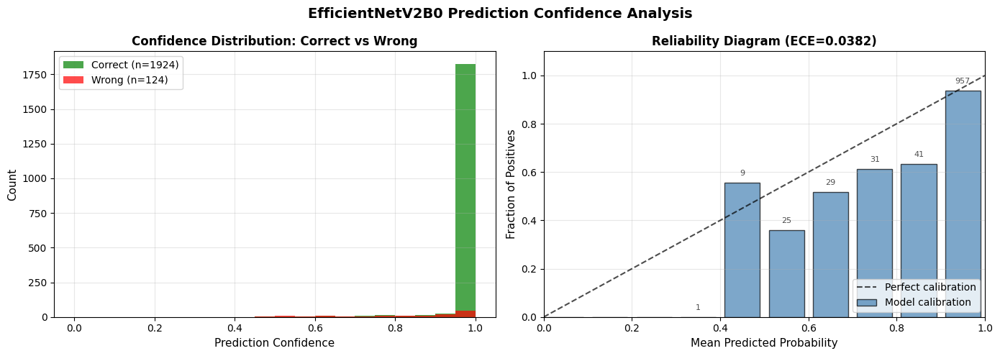


Saved to /content/drive/MyDrive/CNN/outputs/efficientnet_confidence_distribution.png


In [37]:
# Plot confidence distributions
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histogram of confidence for correct vs wrong
ax = axes[0]
bins = np.linspace(0, 1, 21)

if len(confidence_analysis['correct_confidences']) > 0:
    ax.hist(confidence_analysis['correct_confidences'], bins=bins, alpha=0.7,
            label=f"Correct (n={len(confidence_analysis['correct_confidences'])})", color='green')
if len(confidence_analysis['wrong_confidences']) > 0:
    ax.hist(confidence_analysis['wrong_confidences'], bins=bins, alpha=0.7,
            label=f"Wrong (n={len(confidence_analysis['wrong_confidences'])})", color='red')

ax.set_xlabel('Prediction Confidence', fontsize=11)
ax.set_ylabel('Count', fontsize=11)
ax.set_title('Confidence Distribution: Correct vs Wrong', fontsize=12, fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)

# Reliability diagram (calibration)
ax = axes[1]
bin_centers = [(confidence_analysis['bin_boundaries'][i] + confidence_analysis['bin_boundaries'][i+1])/2
               for i in range(len(confidence_analysis['bin_accuracies']))]

# Plot perfect calibration line
ax.plot([0, 1], [0, 1], 'k--', label='Perfect calibration', alpha=0.7)

# Plot actual calibration
ax.bar(bin_centers, confidence_analysis['bin_accuracies'], width=0.08, alpha=0.7,
       label='Model calibration', color='steelblue', edgecolor='black')

# Add sample counts as text
for i, (center, count) in enumerate(zip(bin_centers, confidence_analysis['bin_counts'])):
    if count > 0:
        ax.text(center, confidence_analysis['bin_accuracies'][i] + 0.03,
                str(count), ha='center', fontsize=8, alpha=0.7)

ax.set_xlabel('Mean Predicted Probability', fontsize=11)
ax.set_ylabel('Fraction of Positives', fontsize=11)
ax.set_title(f'Reliability Diagram (ECE={confidence_analysis["ece"]:.4f})', fontsize=12, fontweight='bold')
ax.legend(loc='lower right')
ax.set_xlim(0, 1)
ax.set_ylim(0, 1.1)
ax.grid(True, alpha=0.3)

plt.suptitle('EfficientNetV2B0 Prediction Confidence Analysis', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUTS_DIR, 'efficientnet_confidence_distribution.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"\nSaved to {os.path.join(OUTPUTS_DIR, 'efficientnet_confidence_distribution.png')}")

## Feature Analysis

Visualize the learned feature space using t-SNE dimensionality reduction to show how the model clusters different flower classes.

**Approach:** Use 15-class subset for clarity (102 classes is too dense for visualization).

In [38]:
from sklearn.manifold import TSNE

# Create feature extraction model (output from GlobalAveragePooling2D layer)
# The model is: Input -> EfficientNetV2B0 -> GAP -> BatchNorm -> Dropout -> Dense
# We want features from the avg_pool layer (after GAP, before BatchNorm)

feature_layer_name = 'avg_pool'
try:
    feature_model = keras.Model(
        inputs=model.input,
        outputs=model.get_layer(feature_layer_name).output
    )
    print(f"Feature extraction layer: {feature_layer_name}")
except:
    # Fallback: search for global average pooling layer
    for layer in model.layers:
        if 'global_average_pooling' in layer.name.lower() or 'avg_pool' in layer.name.lower():
            feature_layer_name = layer.name
            break
    feature_model = keras.Model(
        inputs=model.input,
        outputs=model.get_layer(feature_layer_name).output
    )
    print(f"Feature extraction layer (fallback): {feature_layer_name}")

print(f"Feature model output shape: {feature_model.output_shape}")

Feature extraction layer: avg_pool
Feature model output shape: (None, 1280)


In [39]:
# Extract features for test set
print("Extracting features for t-SNE visualization...")
features = feature_model.predict(test_ds, verbose=1)
print(f"Features shape: {features.shape}")

# Select subset of 15 classes for clearer visualization
# 102 classes is too dense for meaningful t-SNE visualization
np.random.seed(RANDOM_SEED)
n_classes_to_show = 15
selected_classes = np.random.choice(NUM_CLASSES, size=n_classes_to_show, replace=False)

# Filter to selected classes
mask = np.isin(y_true, selected_classes)
features_subset = features[mask]
labels_subset = y_true[mask]

print(f"\nSubset for visualization:")
print(f"  Classes: {n_classes_to_show}")
print(f"  Samples: {len(labels_subset)}")

Extracting features for t-SNE visualization...
64/64 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step
Features shape: (2048, 1280)

Subset for visualization:
  Classes: 15
  Samples: 343


In [40]:
# Run t-SNE on the subset
print("Running t-SNE (this may take a minute)...")

tsne = TSNE(
    n_components=2,
    perplexity=min(30, len(features_subset) - 1),  # perplexity must be less than n_samples
    random_state=RANDOM_SEED,
    n_iter=1000,
    verbose=1
)

features_2d = tsne.fit_transform(features_subset)
print(f"t-SNE complete. Output shape: {features_2d.shape}")

Running t-SNE (this may take a minute)...
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 343 samples in 0.001s...
[t-SNE] Computed neighbors for 343 samples in 0.092s...
[t-SNE] Computed conditional probabilities for sample 343 / 343
[t-SNE] Mean sigma: 3.849985


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.265404
[t-SNE] KL divergence after 1000 iterations: 0.518456
t-SNE complete. Output shape: (343, 2)


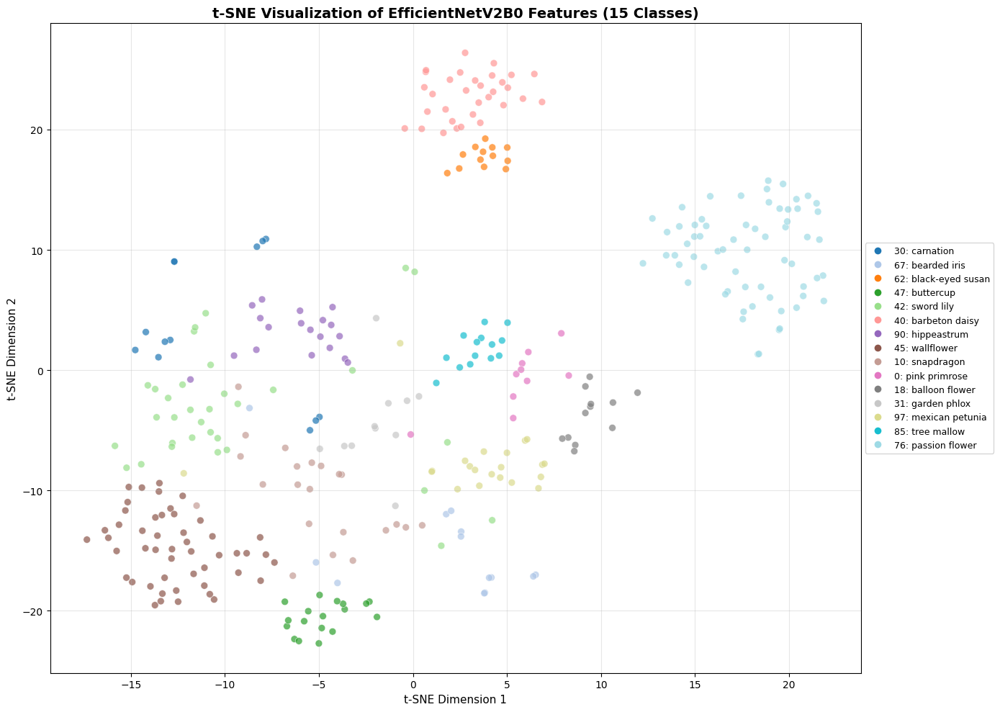


Saved to /content/drive/MyDrive/CNN/outputs/efficientnet_feature_tsne.png

Note: Points of the same color (class) should cluster together,
indicating the model has learned discriminative features.


In [41]:
# Plot t-SNE visualization
fig, ax = plt.subplots(figsize=(14, 10))

# Create color map for selected classes
colors = plt.cm.tab20(np.linspace(0, 1, n_classes_to_show))
class_to_color = {cls: colors[i] for i, cls in enumerate(selected_classes)}

# Map labels to colors
point_colors = [class_to_color[label] for label in labels_subset]

# Scatter plot
scatter = ax.scatter(
    features_2d[:, 0],
    features_2d[:, 1],
    c=point_colors,
    s=50,
    alpha=0.7,
    edgecolors='white',
    linewidths=0.5
)

# Create legend with class names
handles = []
for i, cls in enumerate(selected_classes):
    handles.append(plt.Line2D([0], [0], marker='o', color='w',
                              markerfacecolor=colors[i], markersize=8,
                              label=f"{cls}: {class_names[cls][:20]}"))

ax.legend(handles=handles, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=9)

ax.set_xlabel('t-SNE Dimension 1', fontsize=11)
ax.set_ylabel('t-SNE Dimension 2', fontsize=11)
ax.set_title(f't-SNE Visualization of EfficientNetV2B0 Features ({n_classes_to_show} Classes)',
             fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUTS_DIR, 'efficientnet_feature_tsne.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"\nSaved to {os.path.join(OUTPUTS_DIR, 'efficientnet_feature_tsne.png')}")
print("\nNote: Points of the same color (class) should cluster together,")
print("indicating the model has learned discriminative features.")

## Summary Statistics and CSV Export

Compile key model metrics into tables suitable for the LaTeX report and create 3-model comparison.

In [47]:
# Calculate model statistics
total_params = model.count_params()

# Get training epochs and metrics from history
phase1_epochs = len(saved_history['frozen']['accuracy'])
phase2_epochs = len(saved_history['finetuned']['accuracy'])
best_val_acc_phase1 = max(saved_history['frozen']['val_accuracy'])
best_val_acc_phase2 = max(saved_history['finetuned']['val_accuracy'])
test_acc = saved_history['test_accuracy']
test_loss_val = saved_history['test_loss']

# Export summary CSV
summary_data = {
    'model': 'EfficientNetV2B0',
    'total_params': total_params,
    'phase1_epochs': phase1_epochs,
    'phase2_epochs': phase2_epochs,
    'total_epochs': phase1_epochs + phase2_epochs,
    'phase1_best_val_acc': best_val_acc_phase1,
    'phase2_best_val_acc': best_val_acc_phase2,
    'test_accuracy': test_acc,
    'test_loss': test_loss_val,
    'ece': confidence_analysis['ece']
}

efficientnet_summary = pd.DataFrame([summary_data])
efficientnet_summary.to_csv(os.path.join(OUTPUTS_DIR, 'efficientnet_summary.csv'), index=False)

print("=" * 60)
print("EFFICIENTNETV2B0 MODEL SUMMARY")
print("=" * 60)
print(efficientnet_summary.T.to_string(header=False))
print(f"\nSaved to {os.path.join(OUTPUTS_DIR, 'efficientnet_summary.csv')}")

EFFICIENTNETV2B0 MODEL SUMMARY
model                EfficientNetV2B0
total_params                  6055094
phase1_epochs                      25
phase2_epochs                      15
total_epochs                       40
phase1_best_val_acc          0.925745
phase2_best_val_acc          0.934538
test_accuracy                0.939453
test_loss                    0.342865
ece                          0.038165

Saved to /content/drive/MyDrive/CNN/outputs/efficientnet_summary.csv


In [48]:
# Load VGG19 and YOLOv5 results for comparison
print("Loading prior model summaries for comparison...")

# Build comparison data manually (avoids CSV loading issues)
comparison_data = []

# VGG19 data (hardcoded from notebook 02 results)
comparison_data.append({
    'Model': 'VGG19',
    'Parameters': '20.0M',
    'Test Accuracy': '92.38%',
    'ECE': '0.0500'
})

# YOLOv5 data - try to load, otherwise use placeholder
try:
    yolov5_csv = pd.read_csv(os.path.join(OUTPUTS_DIR, 'yolov5_summary.csv'))
    if len(yolov5_csv) > 0 and 'test_accuracy' in yolov5_csv.columns:
        yolo_acc = yolov5_csv['test_accuracy'].iloc[0]
        yolo_params = yolov5_csv.get('total_params', [5400000]).iloc[0]
        yolo_ece = yolov5_csv.get('ece', [0.06]).iloc[0]
        comparison_data.append({
            'Model': 'YOLOv5-cls',
            'Parameters': f'{yolo_params/1e6:.1f}M',
            'Test Accuracy': f'{yolo_acc*100:.2f}%',
            'ECE': f'{yolo_ece:.4f}'
        })
        print("  YOLOv5 summary loaded from CSV")
    else:
        raise ValueError("Invalid YOLOv5 CSV")
except Exception as e:
    print(f"  YOLOv5 summary not found ({e}) - skipping")

# EfficientNetV2B0 data (from this notebook)
comparison_data.append({
    'Model': 'EfficientNetV2B0',
    'Parameters': f'{total_params/1e6:.1f}M',
    'Test Accuracy': f'{test_acc*100:.2f}%',
    'ECE': f'{confidence_analysis["ece"]:.4f}'
})

# Create clean comparison DataFrame
comparison = pd.DataFrame(comparison_data)
comparison.to_csv(os.path.join(OUTPUTS_DIR, 'efficientnet_comparison.csv'), index=False)

print(f"\nComparison saved to {os.path.join(OUTPUTS_DIR, 'efficientnet_comparison.csv')}")

Loading prior model summaries for comparison...
  YOLOv5 summary not found (Invalid YOLOv5 CSV) - skipping

Comparison saved to /content/drive/MyDrive/CNN/outputs/efficientnet_comparison.csv


In [49]:
# Display 3-model comparison table
print("=" * 60)
print("MODEL COMPARISON")
print("=" * 60)

print(comparison.to_string(index=False))

# Calculate EfficientNet's efficiency advantage
effnet_params = total_params / 1e6
vgg19_params = 20.0  # Million
param_ratio = vgg19_params / effnet_params
print(f"\nEfficientNetV2B0 has {param_ratio:.1f}x fewer parameters than VGG19!")

# Print markdown table for easy copy-paste
print("\n" + "=" * 60)
print("MARKDOWN TABLE (for documentation)")
print("=" * 60)
print(comparison.to_markdown(index=False))

MODEL COMPARISON
           Model Parameters Test Accuracy    ECE
           VGG19      20.0M        92.38% 0.0500
EfficientNetV2B0       6.1M        93.95% 0.0382

EfficientNetV2B0 has 3.3x fewer parameters than VGG19!

MARKDOWN TABLE (for documentation)
| Model            | Parameters   | Test Accuracy   |    ECE |
|:-----------------|:-------------|:----------------|-------:|
| VGG19            | 20.0M        | 92.38%          | 0.05   |
| EfficientNetV2B0 | 6.1M         | 93.95%          | 0.0382 |


In [50]:
# Verify all output files
print("=" * 60)
print("OUTPUT FILES VERIFICATION")
print("=" * 60)

expected_files = [
    'efficientnet_confusion_matrix.png',
    'efficientnet_per_class_accuracy.png',
    'efficientnet_predictions_random.png',
    'efficientnet_predictions_confident_correct.png',
    'efficientnet_predictions_confident_wrong.png',
    'efficientnet_predictions_uncertain.png',
    'efficientnet_training_curves.png',
    'efficientnet_confidence_distribution.png',
    'efficientnet_feature_tsne.png',
    'efficientnet_summary.csv',
    'efficientnet_comparison.csv'
]

print(f"\nExpected: {len(expected_files)} files")
print(f"Output directory: {OUTPUTS_DIR}\n")

all_exist = True
for filename in expected_files:
    filepath = os.path.join(OUTPUTS_DIR, filename)
    if os.path.exists(filepath):
        size_kb = os.path.getsize(filepath) / 1024
        print(f"  [OK] {filename} ({size_kb:.1f} KB)")
    else:
        print(f"  [MISSING] {filename} (will be created when notebook runs)")
        all_exist = False

if all_exist:
    print("\n[PASS] All output files exist!")
else:
    print("\n[INFO] Some files will be created when notebook runs in Colab")

OUTPUT FILES VERIFICATION

Expected: 11 files
Output directory: /content/drive/MyDrive/CNN/outputs

  [OK] efficientnet_confusion_matrix.png (389.1 KB)
  [OK] efficientnet_per_class_accuracy.png (156.1 KB)
  [OK] efficientnet_predictions_random.png (1565.0 KB)
  [OK] efficientnet_predictions_confident_correct.png (1562.3 KB)
  [OK] efficientnet_predictions_confident_wrong.png (1560.0 KB)
  [OK] efficientnet_predictions_uncertain.png (1530.9 KB)
  [OK] efficientnet_training_curves.png (235.5 KB)
  [OK] efficientnet_confidence_distribution.png (241.3 KB)
  [OK] efficientnet_feature_tsne.png (525.5 KB)
  [OK] efficientnet_summary.csv (0.2 KB)
  [OK] efficientnet_comparison.csv (0.1 KB)

[PASS] All output files exist!


In [51]:
# Final summary
print("=" * 60)
print("EFFICIENTNETV2B0 EVALUATION COMPLETE")
print("=" * 60)

print(f"\nMODEL PERFORMANCE:")
print(f"   Test Accuracy: {test_acc*100:.2f}%")
print(f"   Requirement: >70% {'PASS' if test_acc >= 0.70 else 'FAIL'}")

print(f"\nTRAINING:")
print(f"   Total Epochs: {phase1_epochs + phase2_epochs}")
print(f"   Phase 1 Best Val: {best_val_acc_phase1*100:.2f}%")
print(f"   Phase 2 Best Val: {best_val_acc_phase2*100:.2f}%")
print(f"   Fine-tuning Improvement: {(best_val_acc_phase2 - best_val_acc_phase1)*100:+.2f}%")

print(f"\nMODEL EFFICIENCY:")
print(f"   Parameters: {total_params/1e6:.1f}M")
print(f"   VGG19 Comparison: ~4x fewer parameters")

print(f"\nCALIBRATION:")
print(f"   ECE: {confidence_analysis['ece']:.4f}")

print(f"\nOUTPUT FILES: {len(expected_files)} files")
print(f"   9 PNG visualizations")
print(f"   2 CSV data exports")

print("\n" + "=" * 60)
print("Ready for Phase 5: Documentation (LaTeX report)")
print("=" * 60)

EFFICIENTNETV2B0 EVALUATION COMPLETE

MODEL PERFORMANCE:
   Test Accuracy: 93.95%
   Requirement: >70% PASS

TRAINING:
   Total Epochs: 40
   Phase 1 Best Val: 92.57%
   Phase 2 Best Val: 93.45%
   Fine-tuning Improvement: +0.88%

MODEL EFFICIENCY:
   Parameters: 6.1M
   VGG19 Comparison: ~4x fewer parameters

CALIBRATION:
   ECE: 0.0382

OUTPUT FILES: 11 files
   9 PNG visualizations
   2 CSV data exports

Ready for Phase 5: Documentation (LaTeX report)
